In [253]:
!pip install -r ../requirements.txt


[notice] A new release of pip available: 22.1.2 -> 22.2.1
[notice] To update, run: pip install --upgrade pip


In [254]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

In [255]:
df = pd.read_csv('https://raw.githubusercontent.com/4GeeksAcademy/data-preprocessing-project-tutorial/main/AB_NYC_2019.csv')
print(f'Shape of the dataset: {df.shape}')
print("The columns 'last_review' and 'reviews_per_month' have aproximately 10000 na values, which i can especulate that those places haven't been reviewed, maybe because they are fake or brand new")
df.info()

Shape of the dataset: (48895, 16)
The columns 'last_review' and 'reviews_per_month' have aproximately 10000 na values, which i can especulate that those places haven't been reviewed, maybe because they are fake or brand new
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  obje

In [256]:
#Transform variables from object to categorical data type

df['name'] = pd.Categorical(df['name'])
df['host_name'] = pd.Categorical(df['host_name'])
df['neighbourhood_group'] = pd.Categorical(df['neighbourhood_group'])
df['neighbourhood'] = pd.Categorical(df['neighbourhood'])
df['room_type'] = pd.Categorical(df['room_type'])
df['last_review'] = pd.to_datetime(df['last_review'])

#Checking
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              48895 non-null  int64         
 1   name                            48879 non-null  category      
 2   host_id                         48895 non-null  int64         
 3   host_name                       48874 non-null  category      
 4   neighbourhood_group             48895 non-null  category      
 5   neighbourhood                   48895 non-null  category      
 6   latitude                        48895 non-null  float64       
 7   longitude                       48895 non-null  float64       
 8   room_type                       48895 non-null  category      
 9   price                           48895 non-null  int64         
 10  minimum_nights                  48895 non-null  int64         
 11  nu

In [257]:
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [258]:
df.describe(include=['category'])

,name,host_name,neighbourhood_group,neighbourhood,room_type
count,48879,48874,48895,48895,48895
unique,47905,11452,5,221,3
top,Hillside Hotel,Michael,Manhattan,Williamsburg,Entire home/apt
freq,18,417,21661,3920,25409


In [259]:
print(f'Columns names: {df.columns} \n')
df.sample(5)

Columns names: Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object') 



,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
7770,5892693,"Large, sunny, private studio Apt 2F",29739883,Adam & Allen,Brooklyn,Greenpoint,40.72232,-73.94340,Entire home/apt,110,2,248,2019-06-13,4.82,2,1
7142,5193916,Private room available in Dumbo Brooklyn,26867230,Kayla,Brooklyn,Fort Greene,40.69605,-73.98207,Private room,45,1,3,2016-07-15,0.08,2,0
4530,3139749,Room in Manhattan=15 min to TimesSq,7580038,Jack Andrew,Manhattan,Harlem,40.82584,-73.94673,Private room,500,1,3,2014-09-27,0.05,3,363
27257,21535750,2 bedroom third floor in the heart of Brooklyn.,156535560,Alex,Brooklyn,Flatbush,40.64116,-73.95991,Entire home/apt,55,2,70,2019-06-24,3.64,1,5
46885,35471285,gorgeous boho soho apartment!,52137386,Camille,Manhattan,Nolita,40.72087,-73.99647,Entire home/apt,203,2,0,NaT,NaN,1,88


In [260]:
#check if there are duplicated publications, by the column 'id'
print(df['id'].duplicated().any())

False


In [261]:
print(df['host_id'].value_counts())
print('There are 37457 different hosts and the one corresponding to the id 219517861 has the greatest amount of published places in the dataset')
print(df[df['host_id'] == 219517861]['host_name'].unique())

print('Seems like Sonder (NYC) is a page for renting places in New York')

219517861    327
107434423    232
30283594     121
137358866    103
16098958      96
            ... 
23727216       1
89211125       1
19928013       1
1017772        1
68119814       1
Name: host_id, Length: 37457, dtype: int64
There are 37457 different hosts and the one corresponding to the id 219517861 has the greatest amount of published places in the dataset
['Sonder (NYC)']
Categories (11452, object): [''Cil', '(Ari) HENRY LEE', '(Email hidden by Airbnb)', '(Mary) Haiy', ..., '빈나', '소정', '진', '현선']
Seems like Sonder (NYC) is a page for renting places in New York


In [262]:
print(df['neighbourhood_group'].value_counts())
print('\nAs expected, there are five boroughs in the dataset')
print('The borough with most publications is Manhattan')

Manhattan        21661
Brooklyn         20104
Queens            5666
Bronx             1091
Staten Island      373
Name: neighbourhood_group, dtype: int64

As expected, there are five boroughs in the dataset
The borough with most publications is Manhattan


In [263]:
print(df['neighbourhood'].value_counts())
print('\nThere are 221 different neighbourhoods in the dataset. The neighbourhood with most published places is Williamsburg, which is in Brooklyn\n')

Williamsburg          3920
Bedford-Stuyvesant    3714
Harlem                2658
Bushwick              2465
Upper West Side       1971
                      ... 
Richmondtown             1
Willowbrook              1
Fort Wadsworth           1
New Dorp                 1
Woodrow                  1
Name: neighbourhood, Length: 221, dtype: int64

There are 221 different neighbourhoods in the dataset. The neighbourhood with most published places is Williamsburg, which is in Brooklyn



In [264]:
print(df['room_type'].unique())
print('There are 3 types of places to rent in the dataset')

['Private room', 'Entire home/apt', 'Shared room']
Categories (3, object): ['Entire home/apt', 'Private room', 'Shared room']
There are 3 types of places to rent in the dataset


In [265]:
print(f'Max price: {df["price"].max()}')
print(f'Min price: {df["price"].min()}')

print(f'Largest prices: {df["price"].nlargest(n=10).values}')
print(f'Cheapest prices: {df["price"].nsmallest(n=50).values}')
print(f'Number of prices equal to 0: {df[df["price"]==0]["price"].count()}')
print(f'Number of prices below 20: {df[df["price"] <= 20]["price"].count()}')
print(f'Number of prices greater than 5000: {df[df["price"] >= 5000]["price"].count()}')

print('There are some publications that state the rent price to be 0, which can mean that those are fake or made with other intentions')
print('Also, there are some very cheap prices, which could be fake or made to catch the atention of the clients')
print('It would be useful to see how the prices are distributed by boroughsor or type of place')


Max price: 10000
Min price: 0
Largest prices: [10000 10000 10000  9999  9999  9999  8500  8000  7703  7500]
Cheapest prices: [ 0  0  0  0  0  0  0  0  0  0  0 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 11 11 11 12 12 12 12 13 15 15 15 15 15 15 16 16 16 16 16 16
 18 18]
Number of prices equal to 0: 11
Number of prices below 20: 87
Number of prices greater than 5000: 26
There are some publications that state the rent price to be 0, which can mean that those are fake or made with other intentions
Also, there are some very cheap prices, which could be fake or made to catch the atention of the clients
It would be useful to see how the prices are distributed by boroughsor or type of place


In [266]:
print(f'Max of minimum nights: {df["minimum_nights"].max()}')
print(f'Min of minimun nights: {df["minimum_nights"].min()}')

print(f'Greatest values for minimum nigths: {df["minimum_nights"].nlargest(n=15).values}')

print('It seems like the platform is used to promote rents not only for tourists but also for people looking for a place to live in New York')
print('It might be interesting to see how the publications are distributed by this parameters')


Max of minimum nights: 1250
Min of minimun nights: 1
Greatest values for minimum nigths: [1250 1000  999  999  999  500  500  500  500  500  480  400  370  366
  365]
It seems like the platform is used to promote rents not only for tourists but also for people looking for a place to live in New York
It might be interesting to see how the publications are distributed by this parameters


In [267]:
print(f'Greatest values for number of reviews: {df["number_of_reviews"].nlargest(n=10).values}')
print(f'Publication with the greatest number of reviews: {df["id"].iloc[11759]}')
print('The publication corresponding to the id 9145202 has the most amount of reviews overall. This does not means so much because we do not know the percentage of bad and good reviews')

Greatest values for number of reviews: [629 607 597 594 576 543 540 510 488 480]
Publication with the greatest number of reviews: 9145202
The publication corresponding to the id 9145202 has the most amount of reviews overall. This does not means so much because we do not know the percentage of bad and good reviews


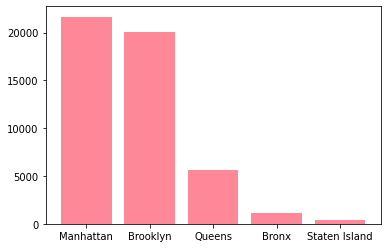

In [268]:
plt.bar(df['neighbourhood_group'].value_counts().index, df['neighbourhood_group'].value_counts() , color='#FF8898')
plt.show()

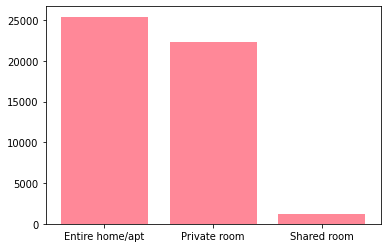

In [269]:
plt.bar(df['room_type'].value_counts().index, df['room_type'].value_counts(), color='#FF8898')
plt.show()

Entire home/apt:
Bronx              379
Brooklyn          9559
Manhattan        13199
Queens            2096
Staten Island      176
Name: neighbourhood_group, dtype: int64

Private rooms:
Bronx              652
Brooklyn         10132
Manhattan         7982
Queens            3372
Staten Island      188
Name: neighbourhood_group, dtype: int64

Shared room:
Bronx             60
Brooklyn         413
Manhattan        480
Queens           198
Staten Island      9
Name: neighbourhood_group, dtype: int64


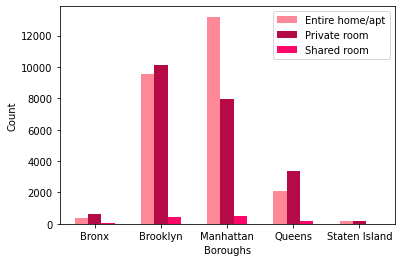

In [270]:
x = np.arange(5)
r1 = df[df['room_type'] == 'Entire home/apt']['neighbourhood_group'].value_counts().sort_index(ascending=True)
r2 = df[df['room_type'] == 'Private room']['neighbourhood_group'].value_counts().sort_index(ascending=True)
r3 = df[df['room_type'] == 'Shared room']['neighbourhood_group'].value_counts().sort_index(ascending=True)

print(f'Entire home/apt:\n{r1}\n')
print(f'Private rooms:\n{r2}\n')
print(f'Shared room:\n{r3}')

plt.bar(x-0.2, r1, 0.2, color='#FF8898')
plt.bar(x, r2, 0.2, color='#B60948')
plt.bar(x+0.2, r3, 0.2, color='#FF0668')
plt.xticks(x, df['neighbourhood_group'].value_counts().sort_index(ascending=True).index)
plt.xlabel("Boroughs")
plt.ylabel("Count")
plt.legend(df['room_type'].value_counts().sort_index(ascending=True).index)
plt.show()

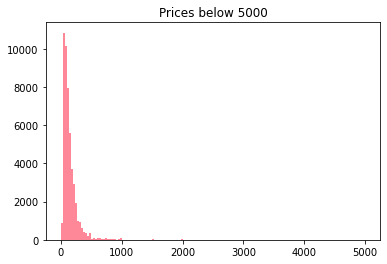

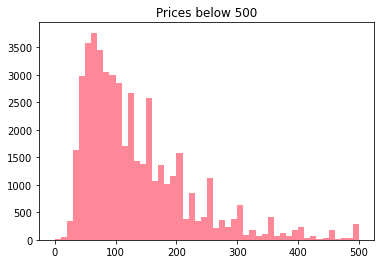

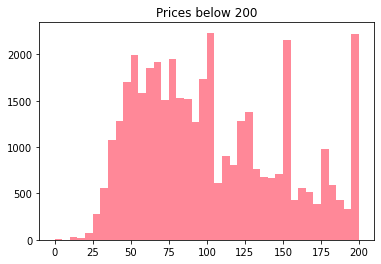

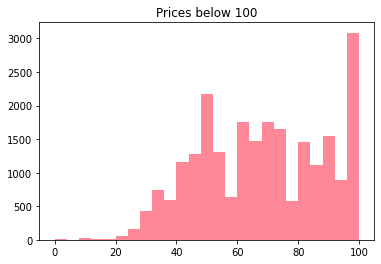

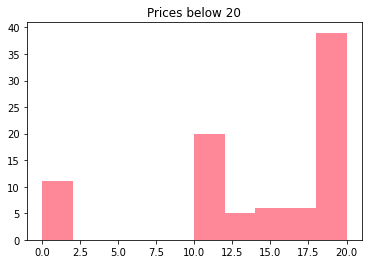

Analizing the plots, it maybe useful to graph prices by borough and also by room type


In [271]:
plt.hist(df[df['price'] <= 5000]['price'], bins=150, color='#FF8898')
plt.title('Prices below 5000')
plt.show()

plt.hist(df[df['price'] <= 500]['price'], bins=50, color='#FF8898')
plt.title('Prices below 500')
plt.show()

plt.hist(df[df['price'] <= 200]['price'], bins=40, color='#FF8898')
plt.title('Prices below 200')
plt.show()

plt.hist(df[df['price'] <= 100]['price'], bins=25, color='#FF8898')
plt.title('Prices below 100')
plt.show()

plt.hist(df[df['price'] <= 20]['price'], bins=10, color='#FF8898')
plt.title('Prices below 20')
plt.show()

print('Analizing the plots, it maybe useful to graph prices by borough and also by room type')

In [272]:
df.groupby('neighbourhood_group')['price'].describe()

,count,mean,std,min,25%,50%,75%,max
neighbourhood_group,,,,,,,,
Bronx,1091.0,87.496792,106.709349,0.0,45.0,65.0,99.0,2500.0
Brooklyn,20104.0,124.383207,186.873538,0.0,60.0,90.0,150.0,10000.0
Manhattan,21661.0,196.875814,291.383183,0.0,95.0,150.0,220.0,10000.0
Queens,5666.0,99.517649,167.102155,10.0,50.0,75.0,110.0,10000.0
Staten Island,373.0,114.812332,277.620403,13.0,50.0,75.0,110.0,5000.0


array([[<AxesSubplot:title={'center':'Bronx'}>,
        <AxesSubplot:title={'center':'Brooklyn'}>],
       [<AxesSubplot:title={'center':'Manhattan'}>,
        <AxesSubplot:title={'center':'Queens'}>],
       [<AxesSubplot:title={'center':'Staten Island'}>, <AxesSubplot:>]],
      dtype=object)

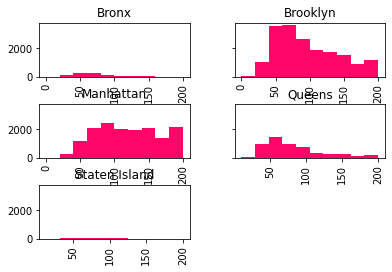

In [273]:
df[df['price']<= 200]['price'].hist(by=df['neighbourhood_group'], sharey=True, color='#FF0668')

In [274]:
px.box(df, x='price', y='neighbourhood_group')

<AxesSubplot:title={'center':'Mean price'}, xlabel='Boroughs'>

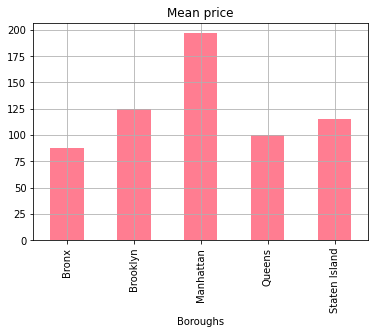

In [275]:
df.groupby(['neighbourhood_group'])['price'].mean().plot(kind='bar', title='Mean price', xlabel='Boroughs', grid = True, color='#FF7D91')

<AxesSubplot:title={'center':'Median price'}, xlabel='Boroughs'>

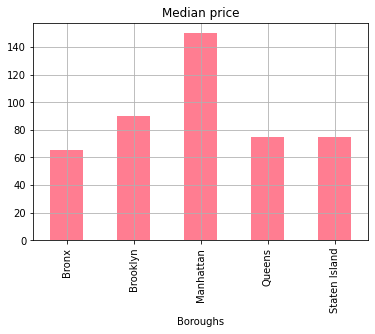

In [276]:
df.groupby(['neighbourhood_group'])['price'].median().plot(kind='bar', title='Median price', xlabel='Boroughs', grid = True, color='#FF7D91')

/tmp/ipykernel_1931/4226787254.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



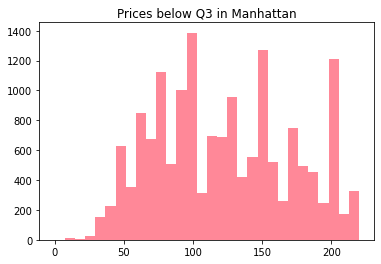

/tmp/ipykernel_1931/4226787254.py:5: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



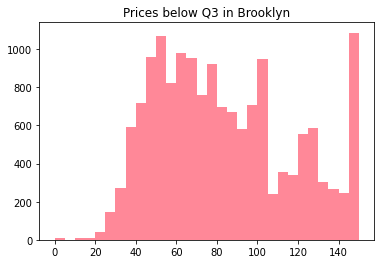

/tmp/ipykernel_1931/4226787254.py:9: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



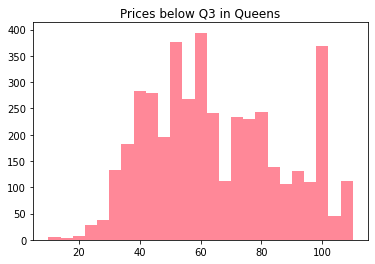

/tmp/ipykernel_1931/4226787254.py:13: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



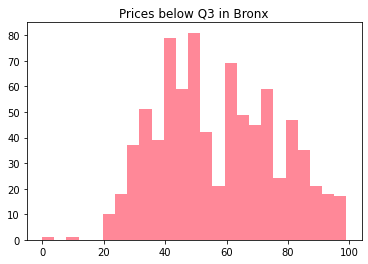

/tmp/ipykernel_1931/4226787254.py:17: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



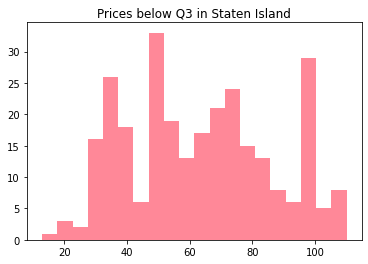

In [277]:
plt.hist(df[df['price'] <= 220][df['neighbourhood_group']=='Manhattan']['price'], bins=30, color='#FF8898')
plt.title('Prices below Q3 in Manhattan')
plt.show()

plt.hist(df[df['price'] <= 150][df['neighbourhood_group']=='Brooklyn']['price'], bins=30, color='#FF8898')
plt.title('Prices below Q3 in Brooklyn')
plt.show()

plt.hist(df[df['price'] <= 110][df['neighbourhood_group']=='Queens']['price'], bins=25, color='#FF8898')
plt.title('Prices below Q3 in Queens')
plt.show()

plt.hist(df[df['price'] <= 99][df['neighbourhood_group']=='Bronx']['price'], bins=25, color='#FF8898')
plt.title('Prices below Q3 in Bronx')
plt.show()

plt.hist(df[df['price'] <= 110][df['neighbourhood_group']=='Staten Island']['price'], bins=20, color='#FF8898')
plt.title('Prices below Q3 in Staten Island')
plt.show()

In [278]:
df.groupby('room_type')['price'].describe()

,count,mean,std,min,25%,50%,75%,max
room_type,,,,,,,,
Entire home/apt,25409.0,211.794246,284.041611,0.0,120.0,160.0,229.0,10000.0
Private room,22326.0,89.780973,160.205262,0.0,50.0,70.0,95.0,10000.0
Shared room,1160.0,70.127586,101.725252,0.0,33.0,45.0,75.0,1800.0


array([[<AxesSubplot:title={'center':'Entire home/apt'}>,
        <AxesSubplot:title={'center':'Private room'}>],
       [<AxesSubplot:title={'center':'Shared room'}>, <AxesSubplot:>]],
      dtype=object)

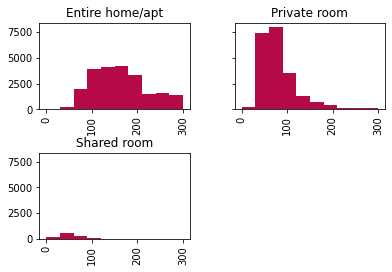

In [279]:
df[df['price']<=300]['price'].hist(by=df['room_type'], sharey=True, color='#B60948')

/tmp/ipykernel_1931/2244216730.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



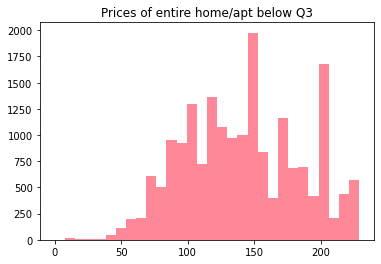

/tmp/ipykernel_1931/2244216730.py:5: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



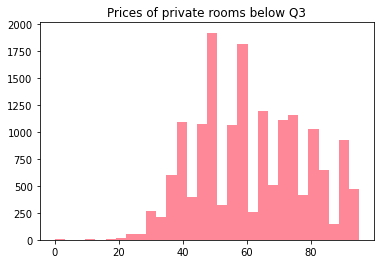

/tmp/ipykernel_1931/2244216730.py:9: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



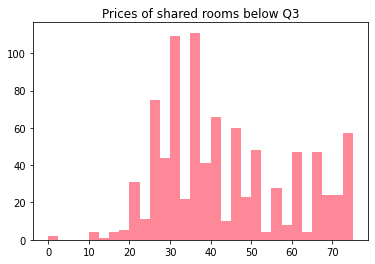

/tmp/ipykernel_1931/2244216730.py:15: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.




Analizing how are distributed the cheapest prices


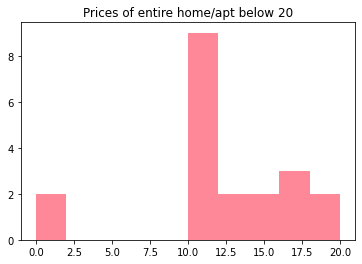

/tmp/ipykernel_1931/2244216730.py:19: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



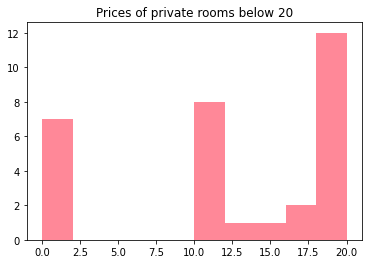

/tmp/ipykernel_1931/2244216730.py:23: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



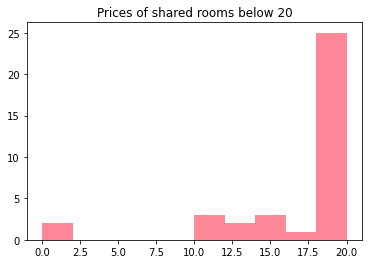

In [280]:
plt.hist(df[df['price'] <= 229][df['room_type']=='Entire home/apt']['price'], bins=30, color='#FF8898')
plt.title('Prices of entire home/apt below Q3')
plt.show()

plt.hist(df[df['price'] <= 95][df['room_type']=='Private room']['price'], bins=30, color='#FF8898')
plt.title('Prices of private rooms below Q3')
plt.show()

plt.hist(df[df['price'] <= 75][df['room_type']=='Shared room']['price'], bins=30, color='#FF8898')
plt.title('Prices of shared rooms below Q3')
plt.show()

print('\nAnalizing how are distributed the cheapest prices')

plt.hist(df[df['price'] <= 20][df['room_type']=='Entire home/apt']['price'], bins=10, color='#FF8898')
plt.title('Prices of entire home/apt below 20')
plt.show()

plt.hist(df[df['price'] <= 20][df['room_type']=='Private room']['price'], bins=10, color='#FF8898')
plt.title('Prices of private rooms below 20')
plt.show()

plt.hist(df[df['price'] <= 20][df['room_type']=='Shared room']['price'], bins=10, color='#FF8898')
plt.title('Prices of shared rooms below 20')
plt.show()

<AxesSubplot:xlabel='neighbourhood_group', ylabel='price'>

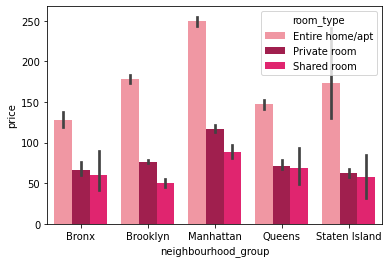

In [281]:
sns.barplot(x='neighbourhood_group', y='price', hue='room_type' , data=df, palette=['#FF8898','#B60948','#FF0668'])

In [282]:
print('Description of prices by room type only in Manhattan')
df[df['neighbourhood_group']=='Manhattan'].groupby('room_type')['price'].describe()

Description of prices by room type only in Manhattan


,count,mean,std,min,25%,50%,75%,max
room_type,,,,,,,,
Entire home/apt,13199.0,249.239109,331.830132,0.0,142.5,191.0,259.00,10000.0
Private room,7982.0,116.776622,190.191318,10.0,68.0,90.0,120.00,9999.0
Shared room,480.0,88.977083,92.416534,10.0,49.0,69.0,89.25,1000.0


/tmp/ipykernel_1931/3143383959.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



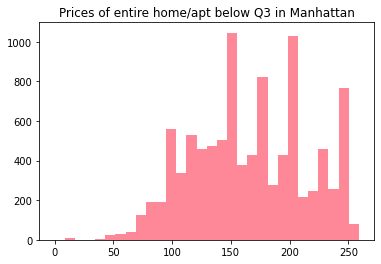

/tmp/ipykernel_1931/3143383959.py:5: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



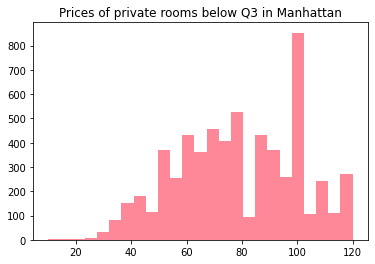

/tmp/ipykernel_1931/3143383959.py:9: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



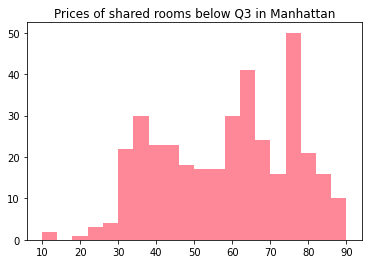

In [283]:
plt.hist(df[df['price'] <= 259][df['room_type']=='Entire home/apt'][df['neighbourhood_group']=='Manhattan']['price'], bins=30, color='#FF8898')
plt.title('Prices of entire home/apt below Q3 in Manhattan')
plt.show()

plt.hist(df[df['price'] <= 120][df['room_type']=='Private room'][df['neighbourhood_group']=='Manhattan']['price'], bins=25, color='#FF8898')
plt.title('Prices of private rooms below Q3 in Manhattan')
plt.show()

plt.hist(df[df['price'] <= 90][df['room_type']=='Shared room'][df['neighbourhood_group']=='Manhattan']['price'], bins=20, color='#FF8898')
plt.title('Prices of shared rooms below Q3 in Manhattan')
plt.show()

In [284]:
print('Description of prices by room type only in Brooklyn')
df[df['neighbourhood_group']=='Brooklyn'].groupby('room_type')['price'].describe()

Description of prices by room type only in Brooklyn


,count,mean,std,min,25%,50%,75%,max
room_type,,,,,,,,
Entire home/apt,9559.0,178.327545,226.415825,0.0,105.0,145.0,199.0,10000.0
Private room,10132.0,76.500099,124.713499,0.0,50.0,65.0,80.0,7500.0
Shared room,413.0,50.527845,53.444485,0.0,30.0,36.0,50.0,725.0


/tmp/ipykernel_1931/380813325.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



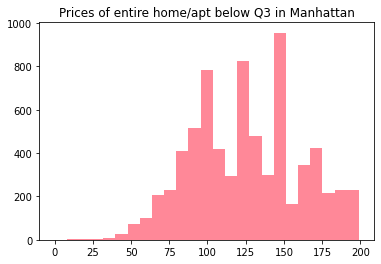

/tmp/ipykernel_1931/380813325.py:5: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



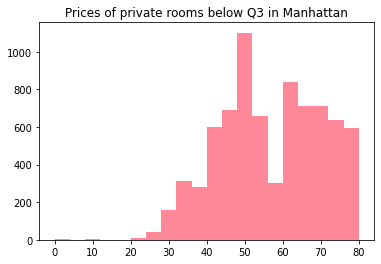

/tmp/ipykernel_1931/380813325.py:9: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



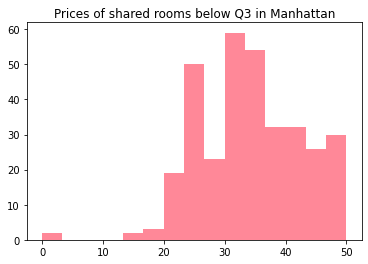

In [285]:
plt.hist(df[df['price'] <= 199][df['room_type']=='Entire home/apt'][df['neighbourhood_group']=='Brooklyn']['price'], bins=25, color='#FF8898')
plt.title('Prices of entire home/apt below Q3 in Manhattan')
plt.show()

plt.hist(df[df['price'] <= 80][df['room_type']=='Private room'][df['neighbourhood_group']=='Brooklyn']['price'], bins=20, color='#FF8898')
plt.title('Prices of private rooms below Q3 in Manhattan')
plt.show()

plt.hist(df[df['price'] <= 50][df['room_type']=='Shared room'][df['neighbourhood_group']=='Brooklyn']['price'], bins=15, color='#FF8898')
plt.title('Prices of shared rooms below Q3 in Manhattan')
plt.show()

<AxesSubplot:>

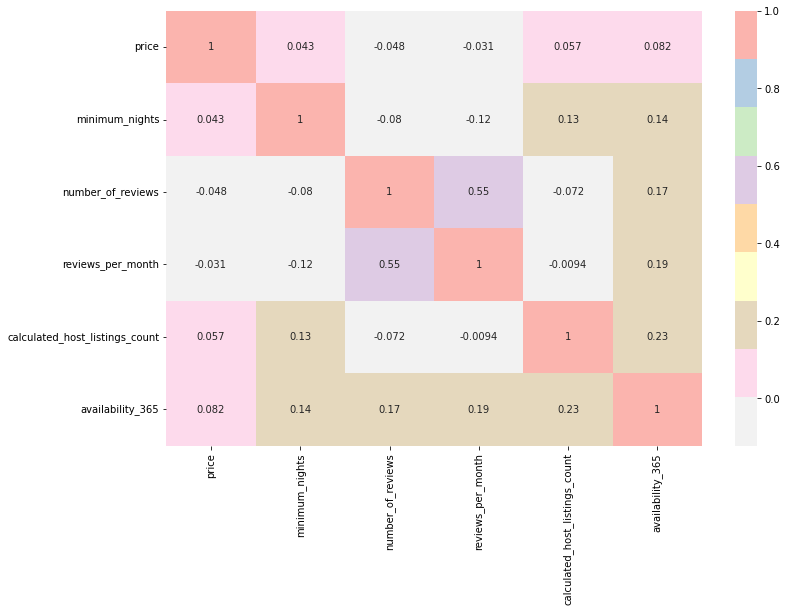

In [286]:
plt.figure(figsize=(12, 8))

sns.heatmap(df[['price','minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count','availability_365']].corr(), annot=True, cmap='Pastel1_r')

In [287]:
px.scatter_mapbox(df[df['price']<=175], lat='latitude', lon='longitude', mapbox_style='open-street-map', color='price')

## CONCLUSIONS

First of all, the analysis made to find correlation between room type and price seems to be correct because the most expensive prices are from
the entire home/apt for example. Also seeing the distribution of places published by borough helps to see where the publications are more
concentrated (which can also be conclued regarding the map).
It seems that the amount of reviews of a publication does not give us useful information beyond how popular a place can be. As we do not have the
comments the people has posted, we cannot decide if having a good amount of reviews is good or bad.
Regarding the heatmap, apart from number of reviews and reviews per month, there are no strong correlations between the other variables.
Stratification by neighbourhood in Manhattan could be possible, and better managed if one have the knowledge of which neighbourhoods are the
most expensive and which are the cheapest (for example i know the upper side in Manhattan is one of the most expensive neighbourhoods).
Column named host name does not give usefuel information, apart from knowing if the host is a person or a business

We proceed to drop the columns last_review and reviews_per_month, and eliminate the rows that have no name and no host_name, as well as eliminate any outliers 
in the price column, stratified by borough

In [290]:
df_processed = df.drop(columns = ['last_review','reviews_per_month'])

In [291]:
df['name'].isnull().sum()

16

In [292]:
df['host_name'].isnull().sum()

21

In [293]:
df_processed = df_processed.dropna()

In [294]:
boroughs = np.array(df['neighbourhood_group'].unique())

for borough in boroughs:
    stat = df_processed[df_processed['neighbourhood_group'] == borough]['price'].describe()
    IQR = stat['75%'] - stat['25%']
    superior = stat['75%'] + IQR*1.5
    inferior = stat['25%'] - IQR*1.5
    count_upper = df_processed[df_processed['neighbourhood_group'] == borough][df_processed['price']>superior]['price'].shape[0]
    
    print(f'Upper bound of price for {borough}: {superior}')
    print(f'Lower boundof price for {borough}: {inferior}')
    print(f'values over the upper bound: {count_upper}')
    print('\n')

    mean = stat['mean']
    df_processed.loc[(df_processed['neighbourhood_group'] == borough) & (df_processed['price']>superior),'price'] = mean



Upper bound of price for Brooklyn: 285.0
Lower boundof price for Brooklyn: -75.0
values over the upper bound: 996


Upper bound of price for Manhattan: 407.5
Lower boundof price for Manhattan: -92.5
values over the upper bound: 1289


Upper bound of price for Queens: 200.0
Lower boundof price for Queens: -40.0
values over the upper bound: 322


Upper bound of price for Staten Island: 200.0
Lower boundof price for Staten Island: -40.0
values over the upper bound: 25


Upper bound of price for Bronx: 180.0
Lower boundof price for Bronx: -36.0
values over the upper bound: 61




/tmp/ipykernel_1931/4054023022.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_1931/4054023022.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_1931/4054023022.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_1931/4054023022.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/tmp/ipykernel_1931/4054023022.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [297]:
px.box(df_processed, x='price', y='neighbourhood_group')

In [298]:
df_processed.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48858 entries, 0 to 48894
Data columns (total 14 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   id                              48858 non-null  int64   
 1   name                            48858 non-null  category
 2   host_id                         48858 non-null  int64   
 3   host_name                       48858 non-null  category
 4   neighbourhood_group             48858 non-null  category
 5   neighbourhood                   48858 non-null  category
 6   latitude                        48858 non-null  float64 
 7   longitude                       48858 non-null  float64 
 8   room_type                       48858 non-null  category
 9   price                           48858 non-null  float64 
 10  minimum_nights                  48858 non-null  int64   
 11  number_of_reviews               48858 non-null  int64   
 12  calculated_host_li

In [299]:
df_processed.to_csv('../data/processed/df_processed.csv')